In [4]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import os

In [3]:
def process_audio(file_path):
    # Load audio with 20s analysis window
    y, sr = librosa.load(file_path, duration=20)  
    
    # Preprocessing
    y = librosa.effects.trim(y)[0]  # Remove silence
    y = librosa.util.normalize(y)   # Normalize volume
    
    # Extract features
    features = {
        'tempo': librosa.beat.tempo(y=y, sr=sr)[0],
        'spectral_centroid': np.mean(librosa.feature.spectral_centroid(y=y, sr=sr)),
        'chroma_stft': np.mean(librosa.feature.chroma_stft(y=y, sr=sr)),
        'rms': np.mean(librosa.feature.rms(y=y)),
        'zcr': np.mean(librosa.feature.zero_crossing_rate(y)),
        'mfcc': np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13), axis=1)
    }

    return features, y, sr

In [7]:
def analyze_tempo(audio_dir):
    tempo_data = []
    
    for file in os.listdir(audio_dir):
        if file.endswith(('.mp3', '.wav')):
            features, y, sr = process_audio(os.path.join(audio_dir, file))
            tempo_data.append({
                'country': file.split('.')[0],
                'tempo': features['tempo'],
                'pulse_clarity': librosa.onset.onset_strength(y=y, sr=sr).mean()
            })
    
    df = pd.DataFrame(tempo_data)
    
    # Plot tempo distribution
    plt.figure(figsize=(12,6))
    plt.hist(df['tempo'], bins=20, edgecolor='black')
    plt.title('National Anthem Tempo Distribution (BPM)')
    plt.xlabel('Beats Per Minute')
    plt.ylabel('Number of Countries')
    plt.axvline(x=df['tempo'].median(), color='r', linestyle='--',
                label=f'Median: {df["tempo"].median():.1f} BPM')
    plt.legend()
    plt.show()
    
    return df

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


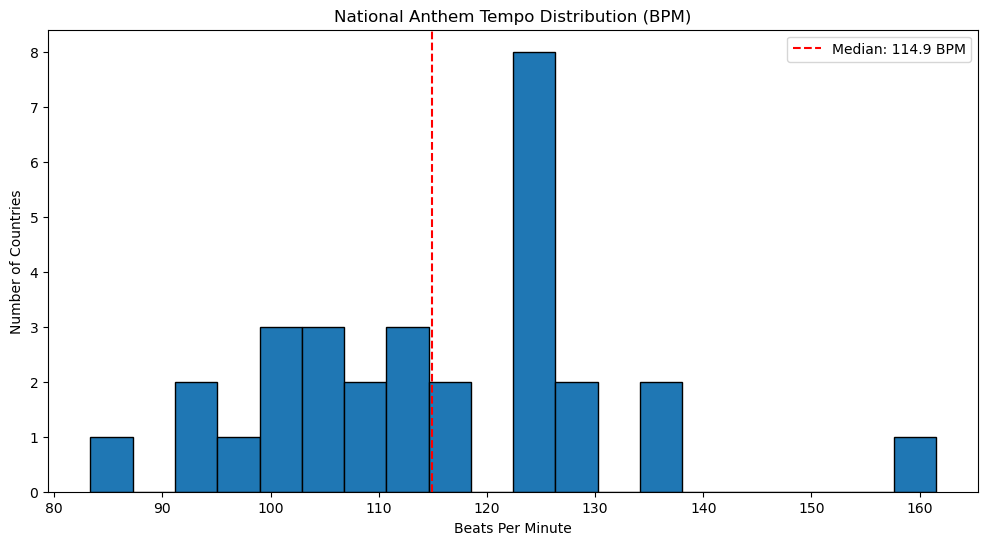

In [8]:
tempo_df = analyze_tempo(r"C:\Users\ASUS\MMDP\anthems_audio")

In [9]:
# What is the Global median tempo?
global_median_tempo = tempo_df['tempo'].median()
print(f'Global Median Tempo: {global_median_tempo:.1f} BPM')

Global Median Tempo: 114.9 BPM


In [10]:
def spectral_analysis(audio_dir):
    spec_features = []
    
    for file in os.listdir(audio_dir)[:30]:  # First 30 files for demo
        features, y, sr = process_audio(os.path.join(audio_dir, file))
        
        # Plot spectrogram
        plt.figure(figsize=(15, 4))
        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
        librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Spectrogram: {file.split(".")[0]}')
        plt.show()
        
        # Store features
        spec_features.append(features)

    # Create feature matrix
    mfcc_df = pd.DataFrame([f['mfcc'] for f in spec_features])
    mfcc_df.columns = [f'mfcc_{i}' for i in range(1,14)]
    
    # Plot MFCC heatmap
    plt.figure(figsize=(12,6))
    plt.imshow(mfcc_df.T, aspect='auto', cmap='viridis')
    plt.yticks(range(13), [f'MFCC {i}' for i in range(1,14)])
    plt.colorbar(label='Coefficient Value')
    plt.title('MFCC Feature Comparison Across Anthems')
    plt.xlabel('Country Index')
    plt.show()
    
    return spec_features

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


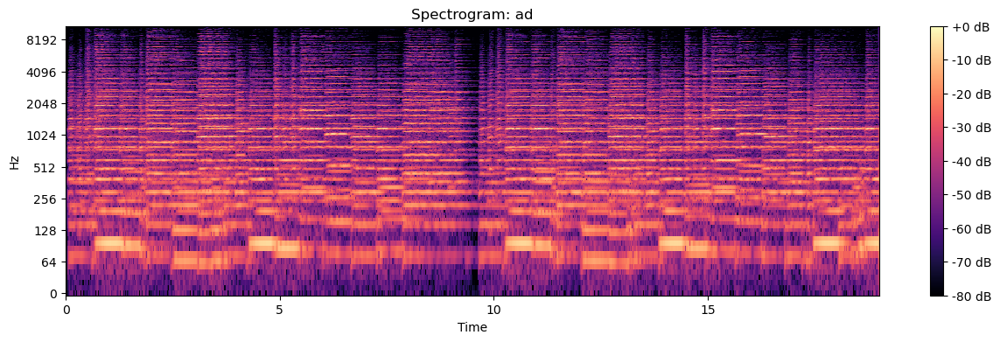

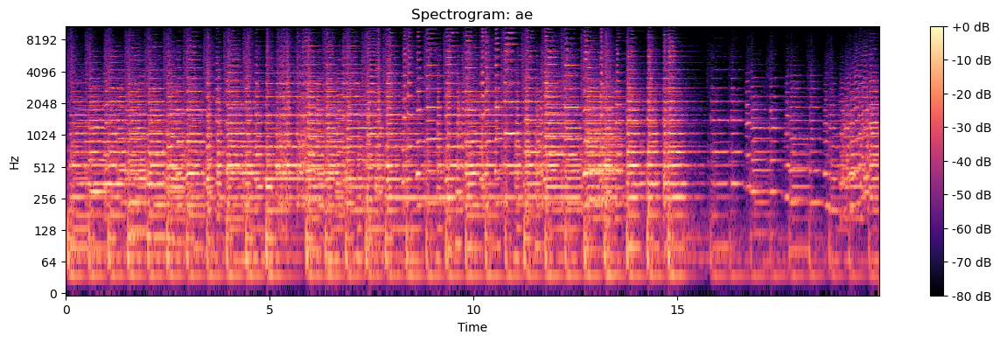

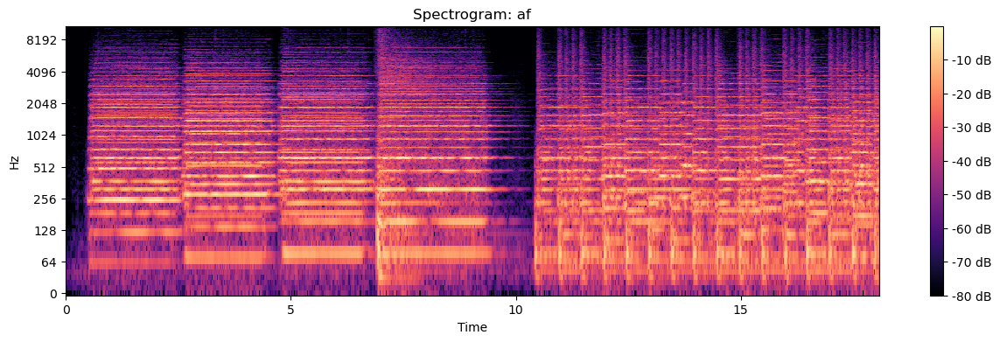

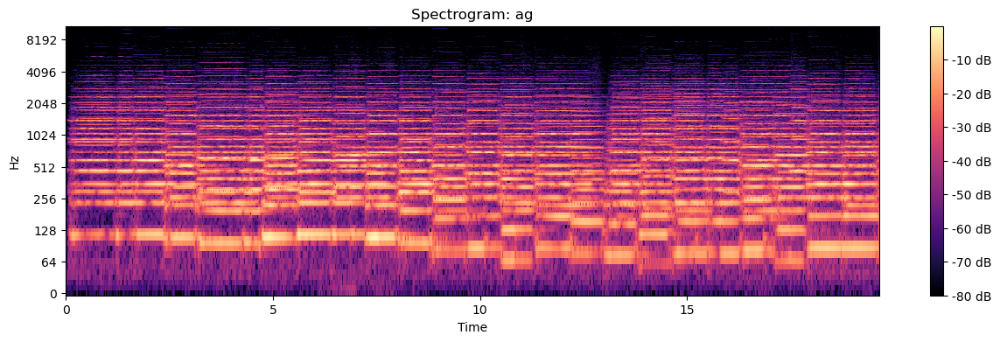

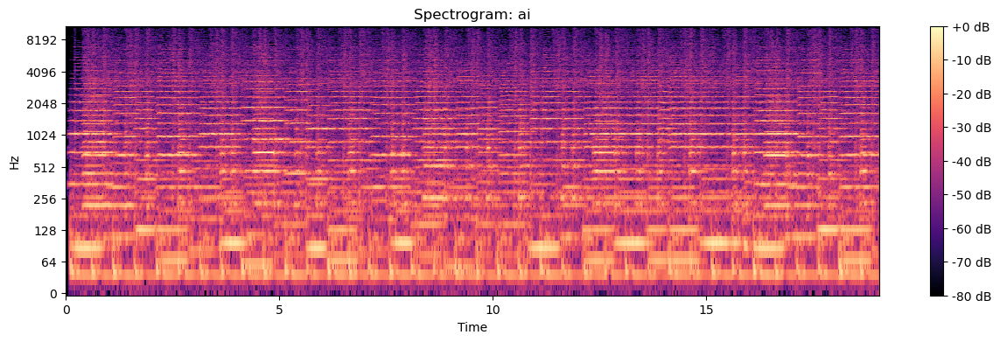

...

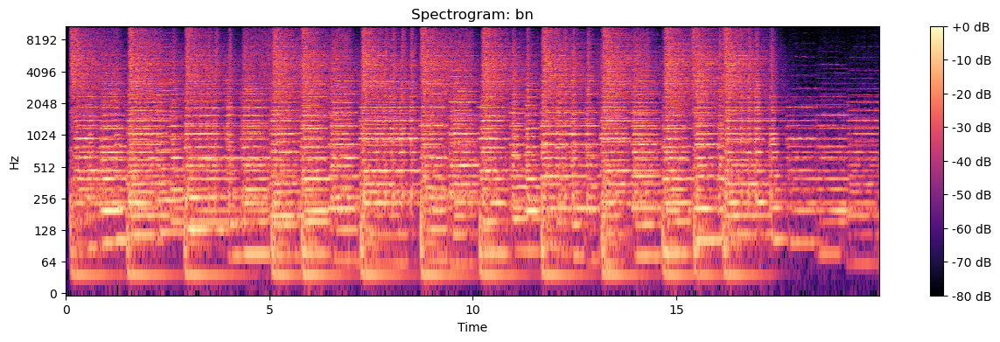

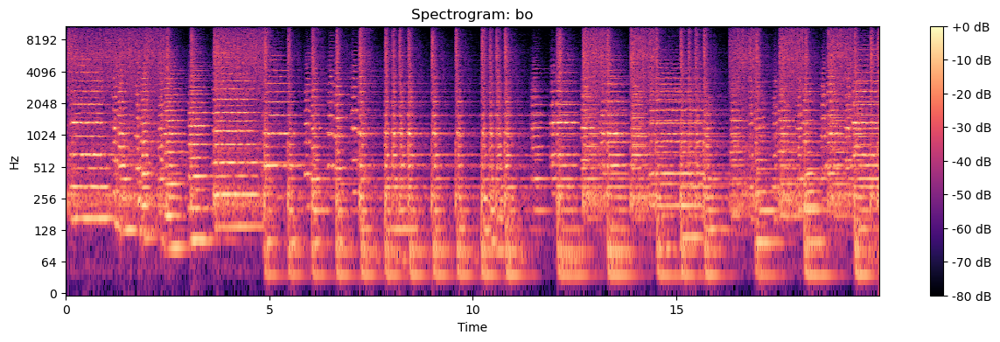

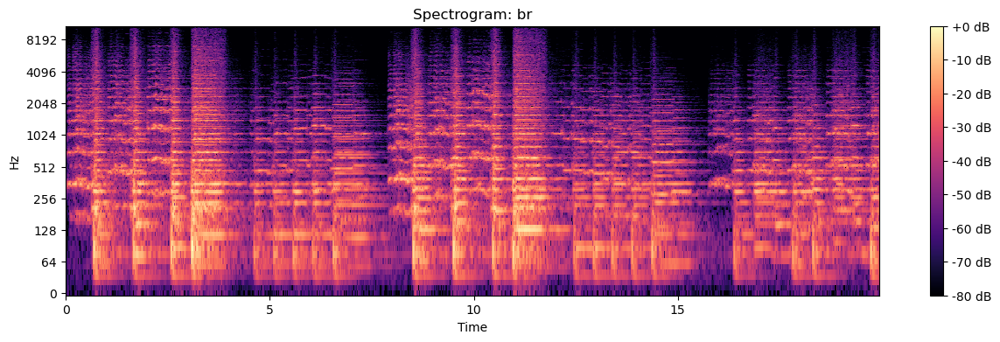

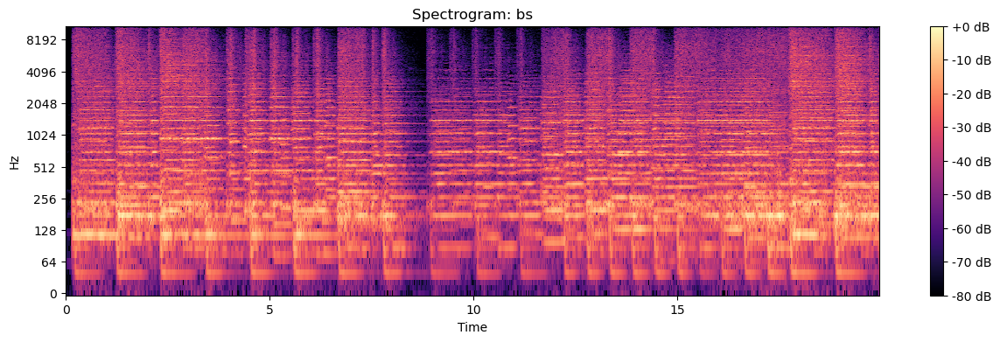

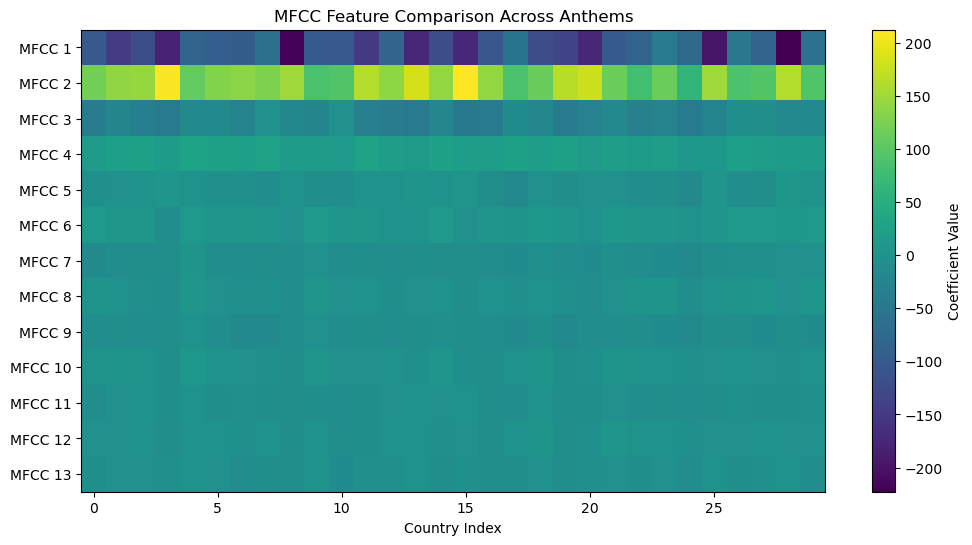

In [11]:
spec_data = spectral_analysis(r"C:\Users\ASUS\MMDP\anthems_audio")

In [12]:
def analyze_structure(y, sr, country):
    # Detect structural boundaries
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    pulse = librosa.beat.plp(onset_envelope=onset_env, sr=sr)
    beats = librosa.util.peak_pick(pulse, pre_max=3, post_max=3, pre_avg=5, post_avg=5, delta=0.5, wait=10)
    
    # Plot structure
    plt.figure(figsize=(15, 4))
    times = librosa.times_like(onset_env, sr=sr)
    plt.plot(times, onset_env/np.max(onset_env), label='Onset Strength')
    plt.vlines(times[beats], 0, 1, color='r', linestyle='--', label='Sections')
    plt.title(f'Structural Segmentation: {country}')
    plt.xlabel('Time (s)')
    plt.legend()
    plt.show()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


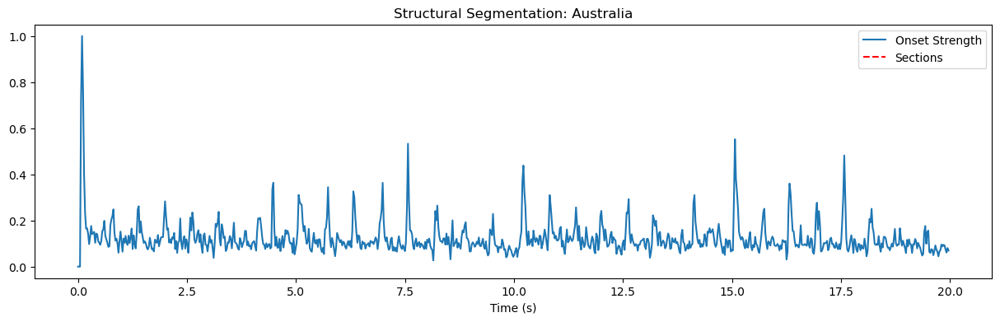

In [14]:
# Lets see its example usage on au
features, y, sr = process_audio(r"C:\Users\ASUS\MMDP\anthems_audio\au.mp3")
analyze_structure(y, sr, 'Australia')

In [15]:
def dynamic_analysis(audio_dir):
    dynamics = []
    
    for file in os.listdir(audio_dir):
        features, y, sr = process_audio(os.path.join(audio_dir, file))
        rms = librosa.feature.rms(y=y)
        
        dynamics.append({
            'country': file.split('.')[0],
            'dynamic_range': np.max(rms) - np.min(rms),
            'loudness_variation': np.std(rms)
        })
    
    df = pd.DataFrame(dynamics)
    plt.figure(figsize=(12,6))
    plt.scatter(df['dynamic_range'], df['loudness_variation'], alpha=0.6)
    plt.title('Anthem Dynamic Range Analysis')
    plt.xlabel('Dynamic Range (RMS)')
    plt.ylabel('Loudness Variation (σ)')
    
    # Annotate extremes
    for _, row in df.nlargest(3, 'dynamic_range').iterrows():
        plt.annotate(row['country'], (row['dynamic_range'], row['loudness_variation']))
    
    plt.grid()
    plt.show()
    
    return df

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


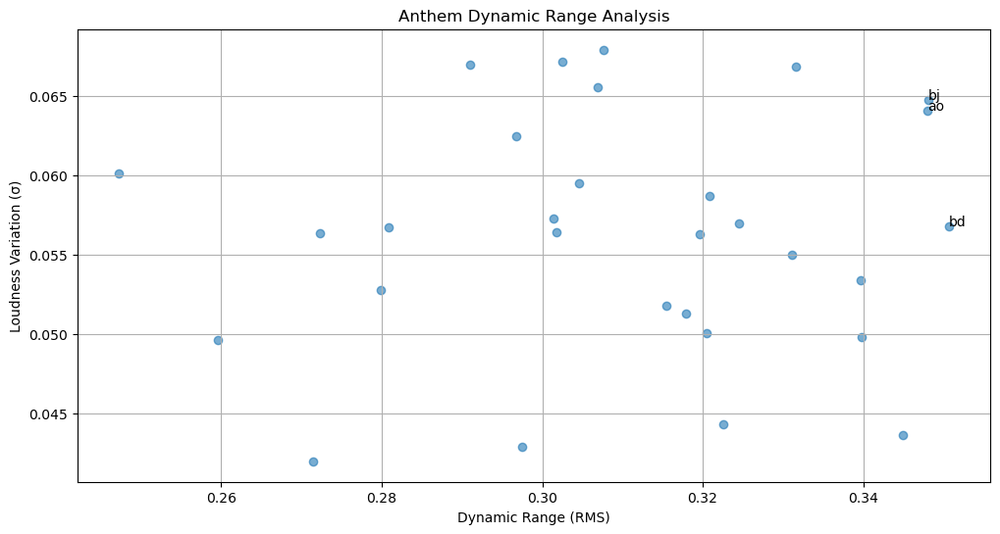

In [16]:
dynamics_df = dynamic_analysis(r"C:\Users\ASUS\MMDP\anthems_audio")

In [17]:
def tonality_analysis(audio_dir):
    tonal_features = []
    
    for file in os.listdir(audio_dir):
        features, y, sr = process_audio(os.path.join(audio_dir, file))
        
        # Estimate tuning
        tuning = librosa.estimate_tuning(y=y, sr=sr)
        
        # Get key/mode
        chroma = librosa.feature.chroma_cqt(y=y, sr=sr)
        key_profile = np.mean(chroma, axis=1)
        
        tonal_features.append({
            'country': file.split('.')[0],
            'tuning_offset': tuning,
            'key_strength': np.max(key_profile),
            'mode': 'major' if np.argmax(key_profile) < 6 else 'minor'
        })

    df = pd.DataFrame(tonal_features)
    
    # Plot mode distribution
    mode_counts = df['mode'].value_counts()
    plt.figure(figsize=(8,6))
    plt.pie(mode_counts, labels=mode_counts.index, autopct='%1.1f%%')
    plt.title('Major vs Minor Key Distribution')
    plt.show()
    
    return df

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],
C:\Users\ASUS\AppData\Local\Temp\ipykernel_13036\752742484.py:11: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


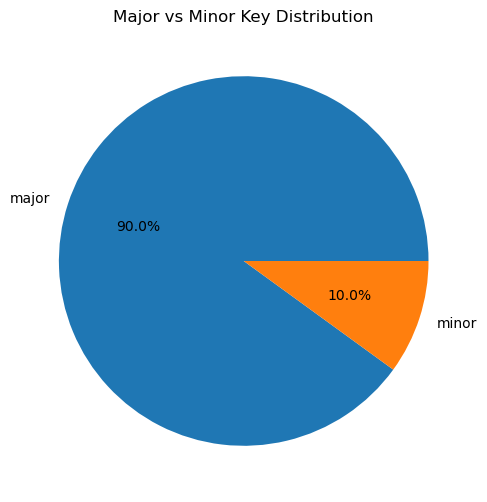

In [18]:
tonality_df = tonality_analysis(r"C:\Users\ASUS\MMDP\anthems_audio")